In [14]:
import numpy as np
import PIL
import os
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
from glob import glob
import random
import cv2
import warnings
warnings.simplefilter('ignore')

In [15]:
import ultralytics
from ultralytics import YOLO
yolo_model = YOLO('yolov8m.pt')

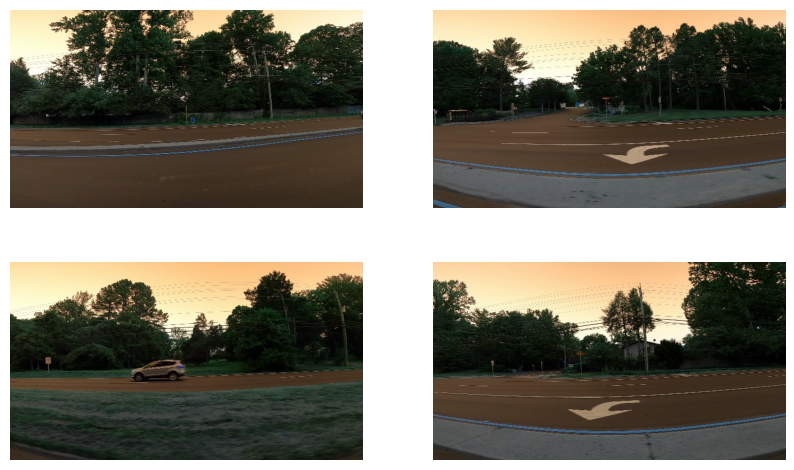

In [16]:
root_path = '/kaggle/input/od-data/OD/streets'
num_samples = 4

images_data = os.listdir(root_path)
random_image = random.sample(images_data, min(num_samples, len(images_data)))

plt.figure(figsize=(10,6))
for i in range(len(random_image)):
    img_path = os.path.join(root_path, random_image[i])
    img = cv2.imread(img_path)
    plt.subplot(2, 2, i+1)
    plt.imshow(img)
    plt.axis('off')

plt.show()


0: 384x640 (no detections), 677.2ms
Speed: 8.6ms preprocess, 677.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 bench, 556.3ms
Speed: 2.5ms preprocess, 556.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: person
Coordinates are: [148.67771911621094, 178.0858154296875, 160.8311767578125, 206.45957946777344]
Confidence is: 0.33
-------
Object 2 is: bench
Coordinates are: [26.544326782226562, 192.02052307128906, 74.05059051513672, 215.34097290039062]
Confidence is: 0.33
-------

0: 384x640 1 car, 554.7ms
Speed: 2.3ms preprocess, 554.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: car
Coordinates are: [231.78562927246094, 188.37255859375, 337.6893310546875, 230.56150817871094]
Confidence is: 0.89
-------

0: 384x640 1 parking meter, 555.6ms
Speed: 2.4ms preprocess, 555.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: parking meter
Coordinates ar

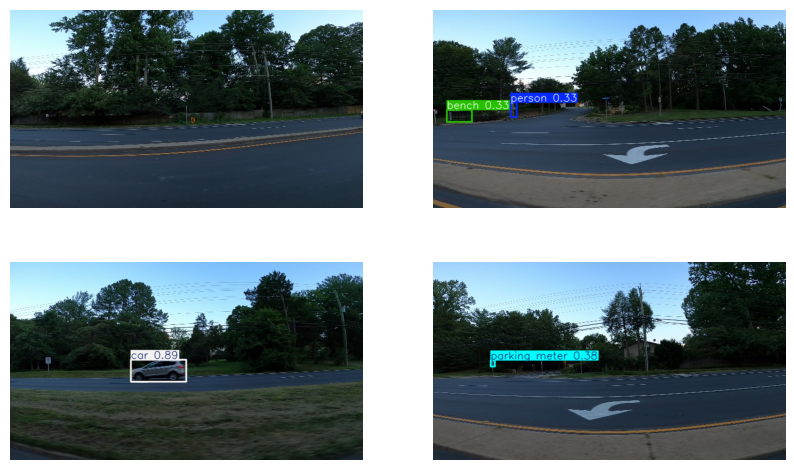

In [19]:
images = []
for i in range(num_samples):
    # Read the image using OpenCV
    img_path = os.path.join(root_path, random_image[i])
    img = cv2.imread(img_path)
    
    # Run YOLO model prediction
    yolo_outputs = yolo_model.predict(img)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names

    # Iterate over detected objects
    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        
        print(f'Object {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')
        print('-------')

    # Plot the results and store the image in the 'images' list (in RGB format)
    images.append(output.plot()[:, :, ::-1])  # Convert from BGR to RGB for Matplotlib


plt.figure(figsize=(10,6))
for i in range(len(images)):
    plt.subplot(2, 2, i+1)
    plt.imshow(images[i]) 
    plt.axis('off')

plt.show()


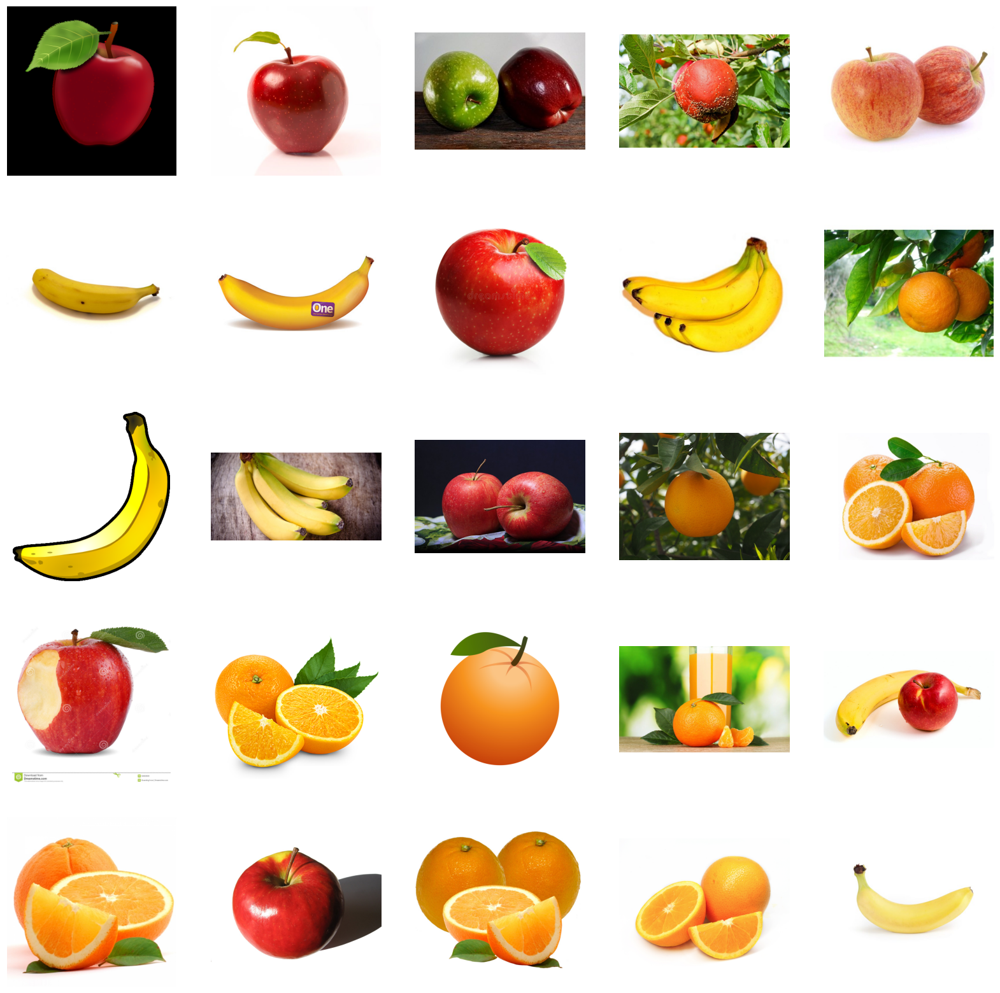

In [20]:
root_path = '/kaggle/input/od-data/OD/fruits/*' 
num_samples = 25
images_data = glob(root_path)
random_image = random.sample(images_data, num_samples)

plt.figure(figsize=(20,20))
for i in range(num_samples):
    plt.subplot(5,5,i+1)
    plt.imshow(cv2.cvtColor(cv2.imread(random_image[i], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))
    plt.axis('off')

In [21]:
# Create a list to store the images
images = []
for i in range(num_samples):
    yolo_outputs = yolo_model.predict(random_image[i])
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names

    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        #print(f'In this image {len(box)} objects has been detected.')
        print(f'Object {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')
        print('-------')

    # Store the image in the 'images' list
    images.append(output.plot()[:, :, ::-1])


image 1/1 /kaggle/input/od-data/OD/fruits/apple_43.jpg: 640x640 1 vase, 963.4ms
Speed: 7.9ms preprocess, 963.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Object 1 is: vase
Coordinates are: [191.86056518554688, 159.2243194580078, 625.8488159179688, 597.022216796875]
Confidence is: 0.52
-------

image 1/1 /kaggle/input/od-data/OD/fruits/apple_22.jpg: 640x640 1 apple, 892.4ms
Speed: 3.2ms preprocess, 892.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Object 1 is: apple
Coordinates are: [144.68878173828125, 195.1807403564453, 562.5884399414062, 606.9130249023438]
Confidence is: 0.94
-------

image 1/1 /kaggle/input/od-data/OD/fruits/apple_25.jpg: 448x640 2 apples, 685.4ms
Speed: 2.2ms preprocess, 685.4ms inference, 3.4ms postprocess per image at shape (1, 3, 448, 640)
Object 1 is: apple
Coordinates are: [16.451662063598633, 38.14109420776367, 173.45751953125, 203.5995635986328]
Confidence is: 0.94
-------
Object 2 is: apple
Coordinates are: [1

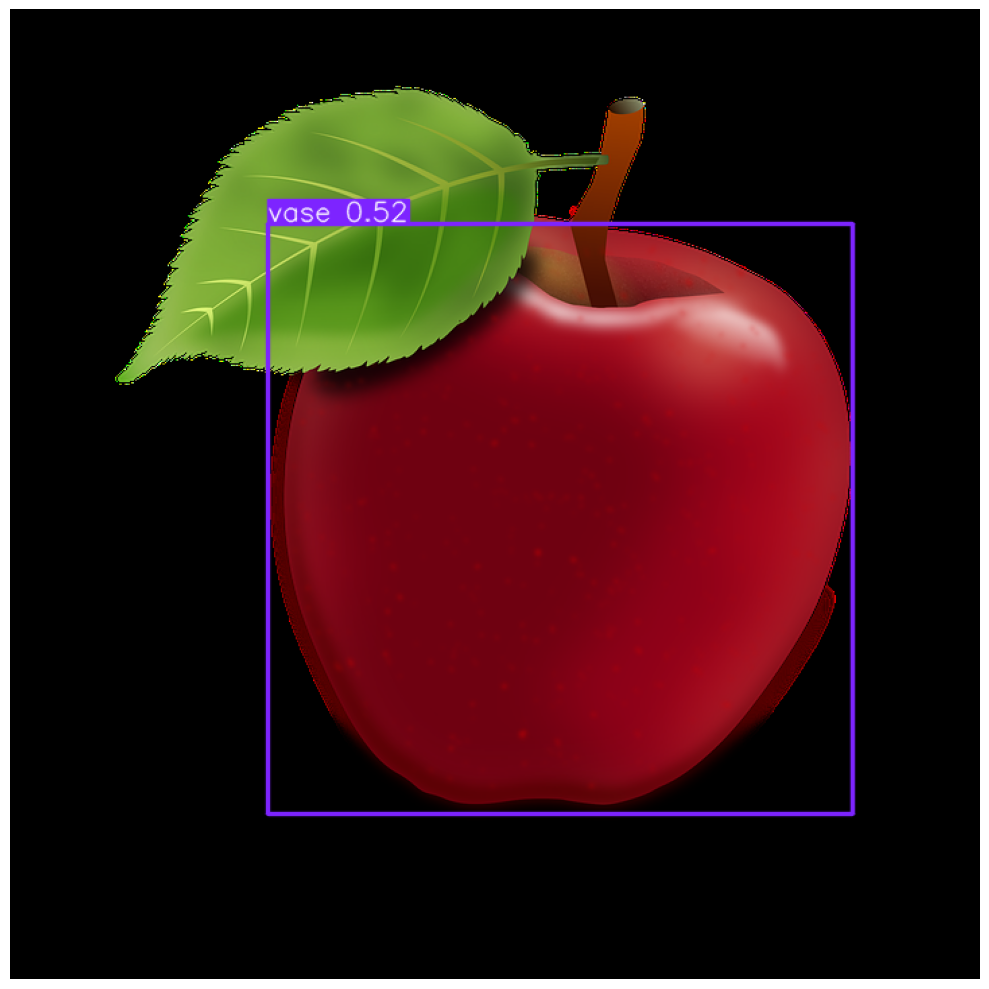

In [22]:
plt.figure(figsize=(10,10))
plt.imshow(images[0])
plt.axis('off')
plt.tight_layout()
plt.show()

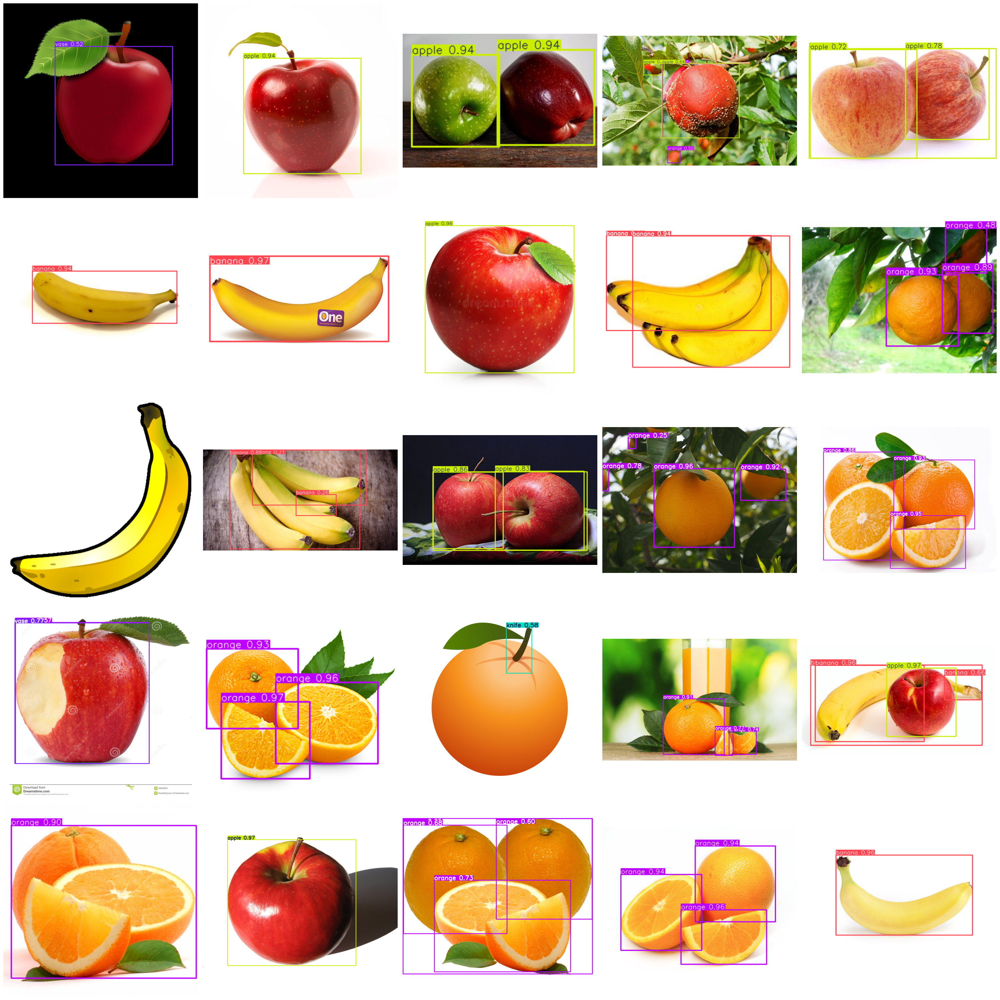

In [23]:
plt.figure(figsize=(30,30))
for i, img in enumerate(images):
    plt.subplot(5,5, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [24]:
def ODImage(image) :
  yolo_outputs = yolo_model.predict(image)
  output = yolo_outputs[0]
  box = output.boxes
  names = output.names
  for j in range(len(box)):
    labels = names[box.cls[j].item()]
    coordinates = box.xyxy[j].tolist()
    confidence = np.round(box.conf[j].item(), 2)
    print(f'Object {j + 1} is: {labels}')
    print(f'Coordinates are: {coordinates}')
    print(f'Confidence is: {confidence}')
    print('-------')
  NewImage = output.plot()[:, :, ::-1]
  plt.figure(figsize=(10,5))
  plt.subplot(1,2,1)
  plt.imshow(cv2.cvtColor(cv2.imread(image, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))
  plt.title('Original Image')
  plt.axis('off')
  plt.subplot(1,2,2)
  plt.imshow(NewImage)
  plt.axis('off')
  plt.title('OD Image')
  plt.show()


image 1/1 /kaggle/input/od-data/OD/fruits/apple_32.jpg: 480x640 2 apples, 685.3ms
Speed: 3.3ms preprocess, 685.3ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Object 1 is: apple
Coordinates are: [45.187557220458984, 253.26539611816406, 714.4117431640625, 914.9962768554688]
Confidence is: 0.96
-------
Object 2 is: apple
Coordinates are: [583.982177734375, 144.7396240234375, 1192.765869140625, 828.6058349609375]
Confidence is: 0.96
-------


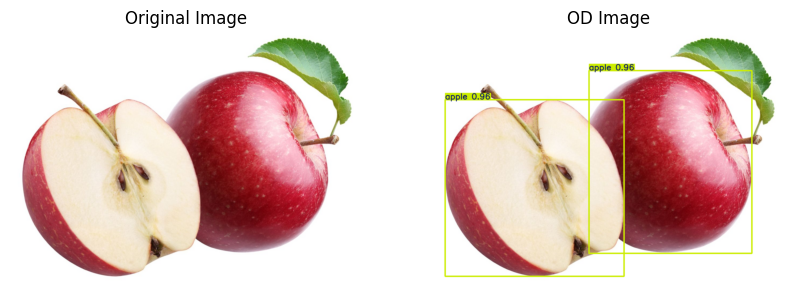

In [25]:
ODImage('/kaggle/input/od-data/OD/fruits/apple_32.jpg')


image 1/1 /kaggle/input/od-data/OD/fruits/apple_6.jpg: 416x640 3 apples, 546.1ms
Speed: 2.4ms preprocess, 546.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)
Object 1 is: apple
Coordinates are: [136.37599182128906, 129.1263885498047, 519.6784057617188, 527.6823120117188]
Confidence is: 0.93
-------
Object 2 is: apple
Coordinates are: [559.5946655273438, 205.13180541992188, 837.7870483398438, 469.87945556640625]
Confidence is: 0.88
-------
Object 3 is: apple
Coordinates are: [786.6802978515625, 188.23068237304688, 947.7295532226562, 439.7656555175781]
Confidence is: 0.75
-------


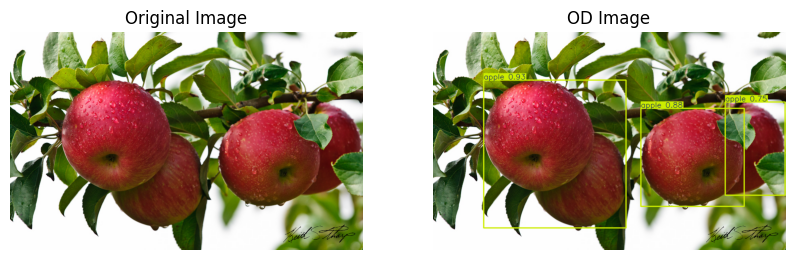

In [26]:
Path = '/kaggle/input/od-data/OD/fruits'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/People/00000767.jpg: 448x640 1 person, 624.0ms
Speed: 2.8ms preprocess, 624.0ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)
Object 1 is: person
Coordinates are: [253.4014434814453, 70.77392578125, 633.1895751953125, 691.9406127929688]
Confidence is: 0.95
-------


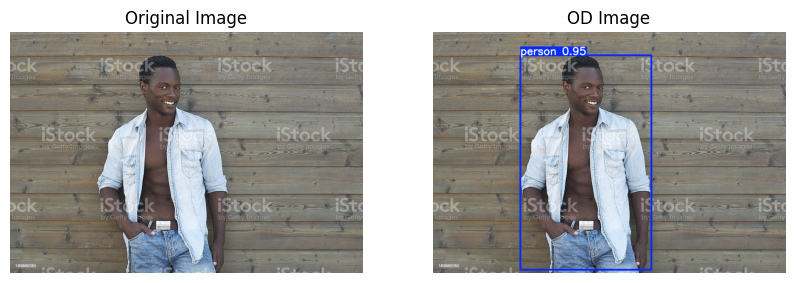

In [27]:
Path = '/kaggle/input/od-data/OD/People'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/People/00000847.jpg: 640x512 1 person, 688.1ms
Speed: 4.1ms preprocess, 688.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)
Object 1 is: person
Coordinates are: [734.291015625, 356.23822021484375, 3376.41259765625, 5094.4931640625]
Confidence is: 0.92
-------


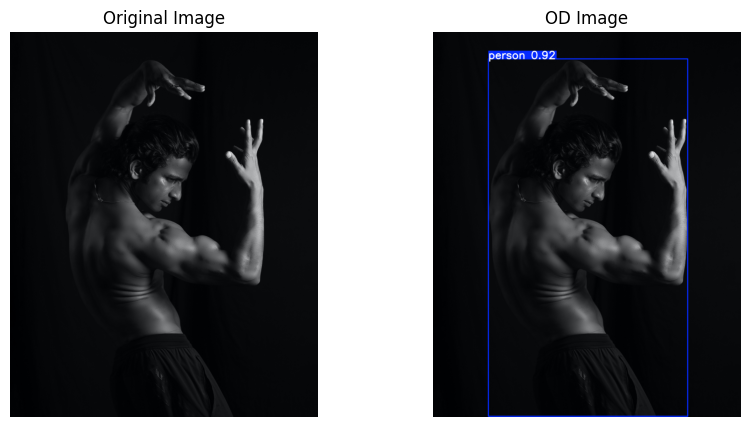

In [42]:
Path = '/kaggle/input/od-data/OD/People'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/People/00000866.jpg: 416x640 1 person, 558.2ms
Speed: 2.7ms preprocess, 558.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)
Object 1 is: person
Coordinates are: [955.5980834960938, 4.424836158752441, 2033.3709716796875, 1258.7353515625]
Confidence is: 0.96
-------


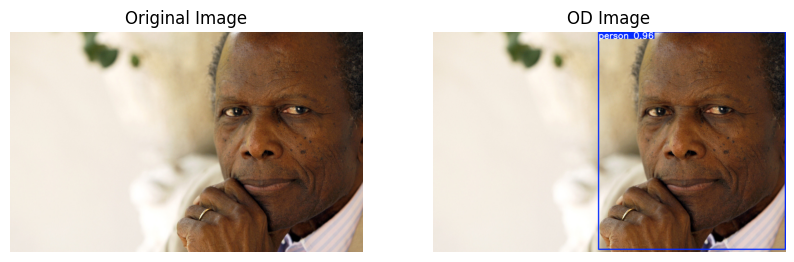

In [43]:
Path = '/kaggle/input/od-data/OD/People'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/digits/_20170531_120030.JPG: 544x640 (no detections), 763.1ms
Speed: 3.3ms preprocess, 763.1ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)


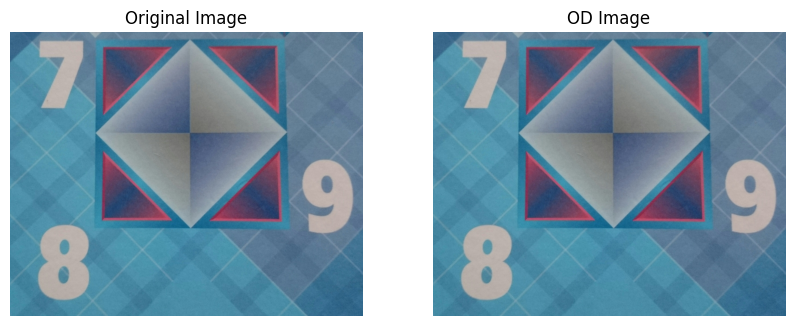

In [44]:
Path = '/kaggle/input/od-data/OD/digits'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/digits/_20170531_151057.JPG: 320x640 1 stop sign, 434.2ms
Speed: 2.2ms preprocess, 434.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)
Object 1 is: stop sign
Coordinates are: [57.77320861816406, 52.618316650390625, 1496.2156982421875, 743.5791015625]
Confidence is: 0.82
-------


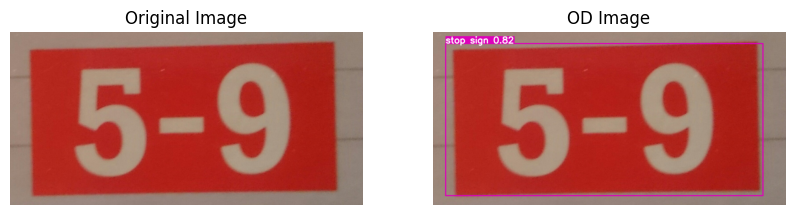

In [45]:
Path = '/kaggle/input/od-data/OD/digits'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/digits/_20170604_175624.JPG: 512x640 1 clock, 655.5ms
Speed: 2.9ms preprocess, 655.5ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)
Object 1 is: clock
Coordinates are: [161.64308166503906, 150.26805114746094, 937.292236328125, 561.382568359375]
Confidence is: 0.77
-------


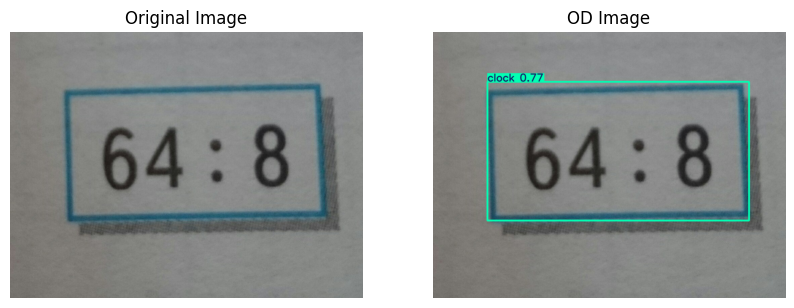

In [47]:
Path = '/kaggle/input/od-data/OD/digits'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/drones/62.JPEG: 384x640 (no detections), 511.6ms
Speed: 2.6ms preprocess, 511.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


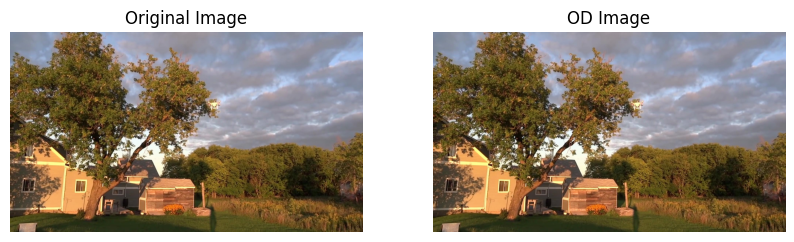

In [48]:
Path = '/kaggle/input/od-data/OD/drones'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/drones/16.JPEG: 384x640 2 benchs, 524.2ms
Speed: 2.6ms preprocess, 524.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: bench
Coordinates are: [841.0986328125, 445.47686767578125, 1003.310302734375, 519.8948364257812]
Confidence is: 0.83
-------
Object 2 is: bench
Coordinates are: [641.2705078125, 448.734375, 806.977294921875, 502.5699462890625]
Confidence is: 0.46
-------


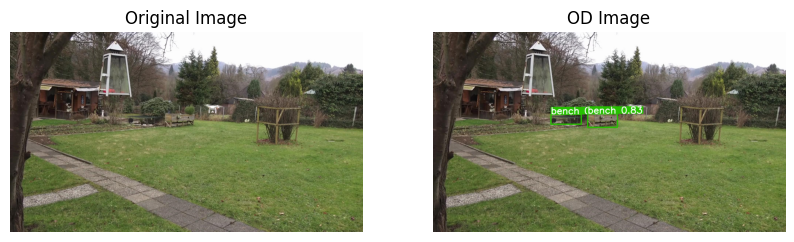

In [49]:
Path = '/kaggle/input/od-data/OD/drones'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/drones/30.JPEG: 384x640 1 person, 2 boats, 1 suitcase, 507.6ms
Speed: 2.5ms preprocess, 507.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: person
Coordinates are: [1047.834716796875, 370.7123107910156, 1339.3978271484375, 658.8140869140625]
Confidence is: 0.9
-------
Object 2 is: suitcase
Coordinates are: [1052.4693603515625, 591.9284057617188, 1365.927490234375, 761.4990844726562]
Confidence is: 0.79
-------
Object 3 is: boat
Coordinates are: [496.39105224609375, 628.5094604492188, 644.2457885742188, 720.4110107421875]
Confidence is: 0.5
-------
Object 4 is: boat
Coordinates are: [497.23712158203125, 664.333984375, 642.1533813476562, 720.7863159179688]
Confidence is: 0.3
-------


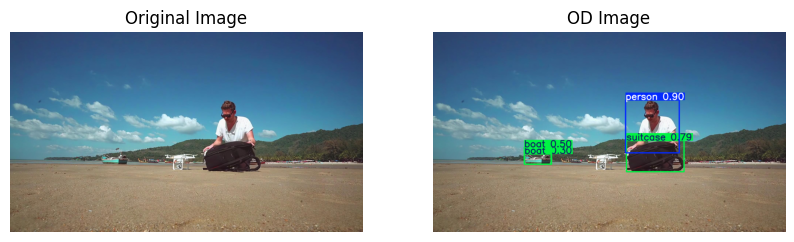

In [50]:
Path = '/kaggle/input/od-data/OD/drones'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/flowers/0040.jpg: 480x640 (no detections), 655.8ms
Speed: 3.3ms preprocess, 655.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


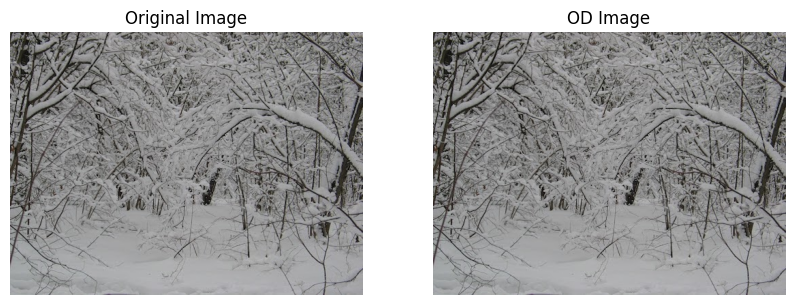

In [53]:
Path = '/kaggle/input/od-data/OD/flowers'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/flowers/0022.jpg: 480x640 1 bird, 647.5ms
Speed: 2.3ms preprocess, 647.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
Object 1 is: bird
Coordinates are: [51.37002182006836, 53.51646423339844, 480.7508850097656, 382.51861572265625]
Confidence is: 0.62
-------


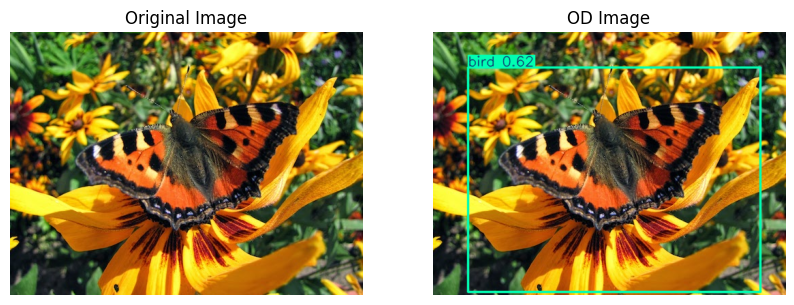

In [54]:
Path = '/kaggle/input/od-data/OD/flowers'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/guns/11.jpeg: 384x640 1 person, 523.7ms
Speed: 2.2ms preprocess, 523.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Object 1 is: person
Coordinates are: [128.14585876464844, 0.6674901843070984, 297.7698669433594, 164.68759155273438]
Confidence is: 0.38
-------


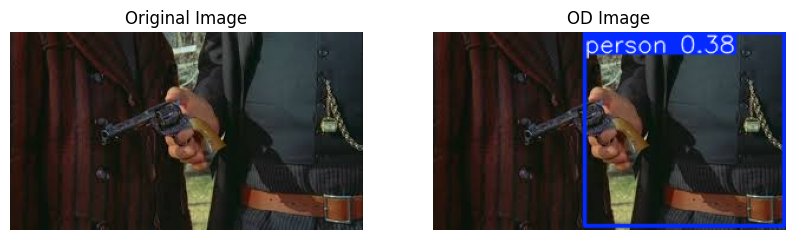

In [58]:
Path = '/kaggle/input/od-data/OD/guns'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))


image 1/1 /kaggle/input/od-data/OD/guns/21.jpeg: 480x640 1 dog, 652.0ms
Speed: 2.8ms preprocess, 652.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Object 1 is: dog
Coordinates are: [5.457725524902344, 12.611355781555176, 185.5242462158203, 147.9662322998047]
Confidence is: 0.45
-------


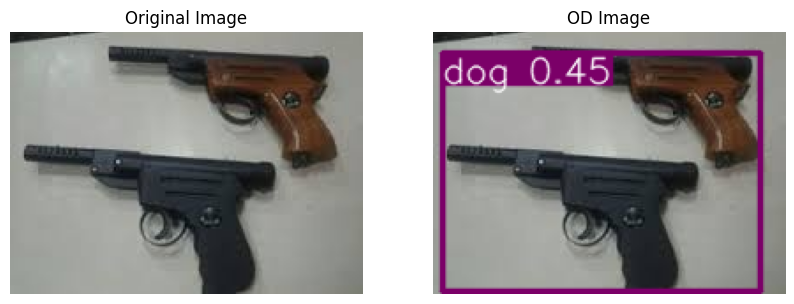

In [60]:
Path = '/kaggle/input/od-data/OD/guns'
ODImage(os.path.join(Path, np.random.choice(os.listdir(Path))))